In [1]:
import importlib

from dataloader.data_utils import *

import torch
import torch.nn as nn
import utils

# Load default args
import pickle
file = open("default_args.obj",'rb')
args = pickle.load(file)
file.close()

args.gpu = "0"
args.num_gpu = utils.set_gpu(args)

ModuleNotFoundError: No module named 'dataloader'

In [3]:
from PIL import Image
from matplotlib.offsetbox import (OffsetImage, AnnotationBbox)

from tqdm import tqdm
import torch.nn.functional as F

import umap

from sklearn.neighbors import KNeighborsClassifier

from copy import deepcopy

# calculating the pairwise distance between each prototype
from sklearn.metrics.pairwise import cosine_similarity

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, Normalize
from matplotlib.collections import LineCollection
from matplotlib.patches import Patch
import math
import numpy as np
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

/BS/fscil/work/envs/fscil_env/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/BS/fscil/work/envs/fscil_env/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/BS/fscil/work/envs/fscil_env/lib/python3.9/site-packages/umap/distances.py:1086: 

In [4]:
torch.manual_seed(0)
np.random.seed(0)

In [5]:
def set_to_embeddings(model, trainset, transform):
    loader = torch.utils.data.DataLoader(dataset=trainset, batch_size=128,
                                              num_workers=8, pin_memory=True, shuffle=False)
    loader.dataset.transform = transform
    
    embedding_list = []
    label_list = []
    og_mode = model.module.mode
    with torch.no_grad():
        tqdm_gen = tqdm(loader)
        tqdm_gen.set_description("Computing Embeddings: ")
        for i, batch in enumerate(tqdm_gen, 1):
            data, label = [_.cuda() for _ in batch]
            model.module.mode = 'backbone'
            embedding = model(data)
            embedding_list.append(embedding)
            label_list.append(label)
    
    model.module.mode = og_mode
    embedding_list = torch.cat(embedding_list, dim=0)
    label_list = torch.cat(label_list, dim=0)

    return embedding_list, label_list

def vis_umap(embedding_list, labels_list, dataset = None):
    data = umap.UMAP(n_components=2).fit_transform(embedding_list.cpu())
    num_classes = len(torch.unique(labels_list))
    # passing to dataframe
    df = pd.DataFrame()
    df["feat_1"] = data[:, 0]
    df["feat_2"] = data[:, 1]
    df["Y"] = labels_list.cpu()
    plt.figure(figsize=(9, 9))
    ax = sns.scatterplot(
        x="feat_1",
        y="feat_2",
        hue="Y",
        palette=sns.color_palette("hls", num_classes),
        data=df,
        legend="full",
        alpha=0.3,
    )
    
    if dataset is not None:
        targets = np.array(base_set.targets)
        samples = {} # label against image
        # select random targets
        selected_targets = np.random.choice(np.unique(targets), size = 10)
        for c in selected_targets:
            ix = np.argwhere(targets == c).flatten()
            choice = np.random.choice(ix)
            samples[c] = base_set.data[choice]
            pil_image = Image.open(samples[c])
            # find x and y coordinate of class c
            row_ix = df.index[df['Y'] == c].tolist()
            row = df.iloc[row_ix[0]]
            x = row["feat_1"]
            y = row["feat_2"]
            imagebox = OffsetImage(pil_image, zoom = 0.1, alpha = 0.6)
            ab = AnnotationBbox(imagebox, (x, y), frameon = False)
            ax.add_artist(ab)
    
    ax.set(xlabel="", ylabel="", xticklabels=[], yticklabels=[])
    ax.tick_params(left=False, right=False, bottom=False, top=False)
    if num_classes > 100:
        anchor = (0.5, 1.8)
    else:
        anchor = (0.5, 1.35)
    plt.legend(loc="upper center", bbox_to_anchor=anchor, ncol=math.ceil(num_classes / 10))
    plt.tight_layout()
    
def load_model(model, model_dir):
    if model_dir is not None:
        best_model_dict = {}
        if model_dir.endswith(".ckpt"):
            solo_dict = torch.load(model_dir)["state_dict"]
            for k,v in solo_dict.items():
                if "backbone" in k:
                    best_model_dict[k.replace("backbone", "module.encoder")] = v
        else:
            print('Loading init parameters from: %s' % model_dir)
            best_model_dict = torch.load(model_dir)['params']
                    
    return best_model_dict

def compute_knn_score(embedding, labels, model, base_testloader):
    # Compute knn score for the backbone. 
    neigh = KNeighborsClassifier(n_neighbors=3)
    neigh.fit(embedding.cpu(), labels.cpu())
    val_embedding, val_labels = loader_to_embeddings(model, base_testloader)
    score = neigh.score(val_embedding.cpu(), val_labels.cpu())
    print(f"Base Class Validation Accuracy usign KNN: {score*100:.3f}")


def get_n_logits(model, n, args, session="base", space="joint"):
    sess = 1
    if session == "base":
        trainset, trainloader, testloader = get_base_dataloader(args)
        classes = torch.arange(args.base_class)
    elif session == "novel":
        # Get first session novel classes
        trainset, trainloader, testloader = get_new_dataloader(args, session = sess)
        assert n <= args.way, print("n must be smaller than then number of shots in the incremental session")
        classes = torch.arange(args.base_class, args.base_class + args.way * sess)
    
    # Sample the classes
    torch.manual_seed(0)
    sampled_classes = (classes[torch.randperm(classes.shape[0])])[:n]
    
    # Now for these sampled classes get the logits
    logits_list = []
    label_list = []
    with torch.no_grad():
        tqdm_gen = tqdm(trainloader)
        for _, batch in enumerate(tqdm_gen, 1):
            data, label = [_.cuda() for _ in batch]
            
            # Filtered_idxs
            idxs = torch.argwhere(torch.isin(label, sampled_classes.cuda())).flatten()
                
            # Skip if no indices this batch for the sampled class
            if idxs.numel() == 0:
                continue
            
            label = label[idxs, ...]
            data = data[idxs, ...]            
            
            # Get logits for all classes up until the 
            embedding = model.module.encode(data)
            logits = model.module.fc.get_logits(embedding)
            
            # Filter our the required labels
            logits_list.append(logits.cpu())
            label_list.append(label.cpu())

        logits_list = torch.cat(logits_list, dim=0)
        label_list = torch.cat(label_list, dim=0)
    
    # Now visualise the logits
    # Average logits for each class
    class_wise_logits = []
    avg_labels = []
    for index in sampled_classes:
        class_index = (label_list == index).nonzero()
        logits_this = logits_list[class_index.squeeze(-1)]
        logits_this = logits_this.mean(0, keepdims=True)
        class_wise_logits.append(logits_this)
        avg_labels.append(index.item())
        
    class_wise_logits = torch.cat(class_wise_logits, dim = 0).cpu().numpy()
    
    return class_wise_logits, avg_labels

def init_base_session_model(args, model_dir, project="base_supcon_sr"):
    # Added arguments that had to be separately added to the argument namespace
    MYNET = importlib.import_module('models.%s.Network' % (project)).MYNET
    helper = importlib.import_module('models.%s.helper' % (project))

    args = set_up_datasets(args)

    model = MYNET(args, mode=args.base_mode, writer = None)
    model = nn.DataParallel(model, list(range(args.num_gpu)))
    model = model.cuda()

#     best_model_dict = load_model(model, model_dir)
    
    if model_dir.endswith(".ckpt"):
        solo_dict = torch.load(model_dir)["state_dict"]
        best_model_dict = {}
        for k,v in solo_dict.items():
            if "backbone" in k:
                best_model_dict[k.replace("backbone", "module.encoder")] = v
            if "projector" in k:
                best_model_dict["module." + k] = v

        load_strict = False
    else:
#         print('Loading init parameters from: %s' % self.args.model_dir)
        best_model_dict = torch.load(model_dir)
    
    # Base Session loading + base prototype generation
    base_set, base_trainloader, base_testloader = get_base_dataloader(args)
    model.load_state_dict(best_model_dict, strict = False)
    out = helper.get_base_fc(base_set, base_testloader.dataset.transform, model, args, return_embeddings=True)
    best_prototypes_cub = out[0]
    
    if "supcon" in project:
        model.module.fc.classifiers[0].weight.data = best_prototypes_cub
        
    best_model_dict = deepcopy(model.state_dict())
    
    return model, best_model_dict, helper

# MINET Supcon pretrained model visualise

In [17]:
args.proj_hidden_dim = 2048
args.proj_output_dim = 128
args.proj_type = "proj"
args.reserve_vector_count = -1
args.reserve_mode = "all"
# minet_model_dir = "/BS/fscil/work/code/solo-learn/trained_models/supcon/r4obzzs3/supcon-minet-auto-augment-r4obzzs3-ep=353.ckpt"
minet_model_dir = "/BS/fscil/work/code/CEC-CVPR2021/checkpoint/base_training_ckpt/cec/session0_max_acc70367_cos.pth"
model, best_model_dict, helper = init_base_session_model(args, minet_model_dir)

Generating Features: : 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:19<00:00, 11.91it/s]


In [18]:
base_set, base_trainloader, base_testloader = get_base_dataloader(args)
embedding_list, label_list = set_to_embeddings(model, base_set, base_testloader.dataset.transform)

Computing Embeddings: : 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:19<00:00, 12.05it/s]


In [19]:
vis_umap(embedding_list, label_list, base_set)

# CUB Supcon pretrained model visualise

## Pretrain + Prep

Computing Embeddings: : 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:03<00:00,  7.20it/s]


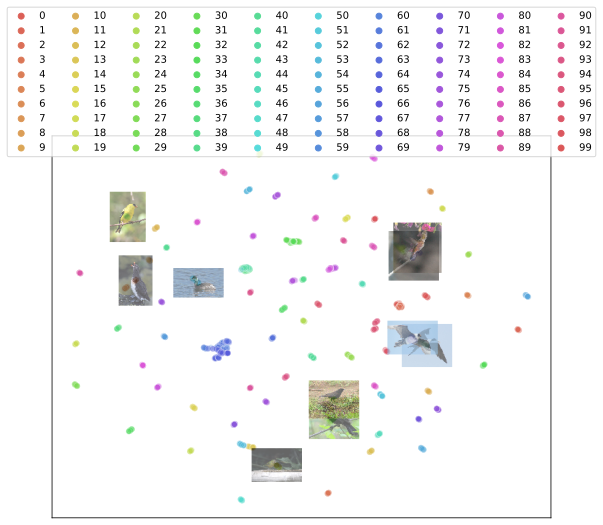

In [13]:
# Pretrain
args.proj_hidden_dim = 2048
args.proj_output_dim = 256
args.proj_type = "proj_ncfscil"
args.reserve_vector_count = -1
args.reserve_mode = "all"
args.dataset = "cub200"

cub_model_dir_pretrained = "/BS/fscil/work/code/solo-learn/trained_models/supcon/ep0hcst3/pretrain_cub_augmix_78_81.ckpt"

model, best_model_dict, helper = init_base_session_model(args, cub_model_dir_pretrained)

base_set, base_trainloader, base_testloader = get_base_dataloader(args)
embedding_list, label_list = set_to_embeddings(model, base_set, base_testloader.dataset.transform)
vis_umap(embedding_list, label_list, base_set)

Computing Embeddings: : 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:03<00:00,  7.44it/s]


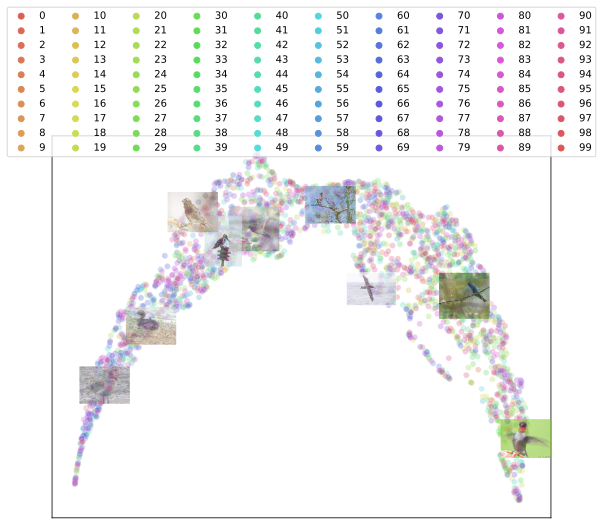

In [14]:
# pretrain + prep
cub_model_dir_prep = "/BS/fscil/work/code/CEC-CVPR2021/checkpoint/cub200/base_supcon_srv3/knn_score_pretrain+prep_ft_dot-ft_dot-data_init-start_1/Epo_100-Lr_0.0250-Step_40-Gam_0.10-Bs_128-Mom_0.90-ftLR_0.050-ftnEpoch_60-jEpoch_100-opt_sgd-vm_hm-ls_0.00-ma_0.30/session0_max_acc.pth"
model, best_model_dict, helper = init_base_session_model(args, cub_model_dir_prep)

base_set, base_trainloader, base_testloader = get_base_dataloader(args)
embedding_list, label_list = set_to_embeddings(model, base_set, base_testloader.dataset.transform)
vis_umap(embedding_list, label_list, base_set)

## Only Prep

Computing Embeddings: : 100%|████████████████████████████████████████████████████████████████████████████████████████████████| 24/24 [00:03<00:00,  7.13it/s]


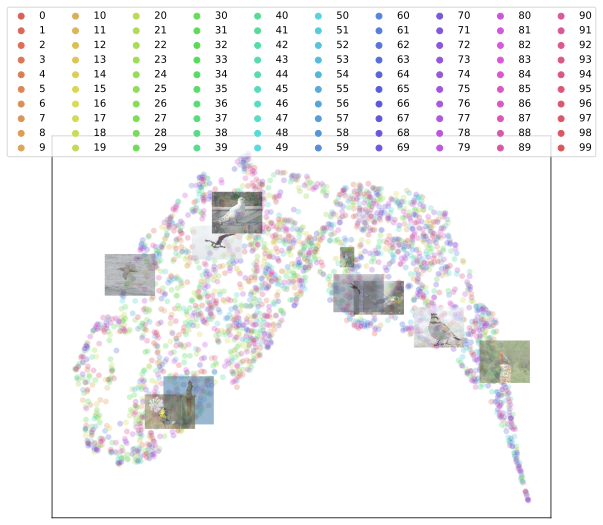

In [15]:
args.proj_hidden_dim = 2048
args.proj_output_dim = 256
args.proj_type = "proj"
args.reserve_vector_count = -1
args.reserve_mode = "all"
args.dataset = "cub200"

cub_model_dir_only_prep = "/BS/fscil/work/code/CEC-CVPR2021/checkpoint/cub200/base_supcon_srv3/knn_score_prep_ft_dot-ft_dot-data_init-start_1/Epo_100-Lr_0.0250-Step_40-Gam_0.10-Bs_128-Mom_0.90-ftLR_0.050-ftnEpoch_60-jEpoch_100-opt_sgd-vm_hm-ls_0.00-ma_0.30/session0_max_acc.pth"
model, best_model_dict, helper = init_base_session_model(args, cub_model_dir_only_prep)

base_set, base_trainloader, base_testloader = get_base_dataloader(args)
embedding_list, label_list = set_to_embeddings(model, base_set, base_testloader.dataset.transform)
vis_umap(embedding_list, label_list, base_set)

# Compute prototype score for mini imagenet model

In [7]:
best_prototypes = helper.get_base_fc(base_set, base_testloader.dataset.transform, model, args, return_cov = False)

Generating Features: : 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 235/235 [00:19<00:00, 12.16it/s]


In [8]:
_, best_va, _, _, _, _, _ = model.module.test_fc(best_prototypes, base_testloader, 0, 0)

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 60/60 [00:05<00:00, 11.97it/s]


In [9]:
best_va

0.8316666503747304

# Visualise angle during simplex training

In [81]:
def compute_angles(vectors):
    # Compute angles for each vector with all others from 
    # Compute angles with the closesnt neighbour only
    proto = vectors.cpu().numpy()
    dot = np.matmul(proto, proto.T)
    dot = dot.clip(min=0, max=1)
    theta = np.arccos(dot)
    np.fill_diagonal(theta, np.nan)
    theta = theta[~np.isnan(theta)].reshape(theta.shape[0], theta.shape[1] - 1)
    
    avg_angle_close = theta.min(axis = 1).mean()
    
    avg_angle = theta.mean()

    return np.rad2deg(avg_angle), np.rad2deg(avg_angle_close)

def normalize(x): 
    x = x / torch.norm(x, dim=1, p=2, keepdim=True)
    return x

points = torch.randn(100, 128).cuda()
points = normalize(points)
points = torch.nn.Parameter(points)
opt = torch.optim.SGD([points], lr=1)
temperature = 1

angle_list = []
avg_angle_list = []

# TODO: Choose 2 points randomly
ixs = torch.randperm(points.shape[0])[:2]

tqdm_gen = tqdm(range(1000))
best_angle = 0
for idx, _ in enumerate(tqdm_gen):
    sim = F.cosine_similarity(points[None,:,:], points[:,None,:], dim=-1)
    sim.fill_diagonal_(0)
    l = torch.log(torch.exp(sim/temperature).sum(axis = 1)).sum() / points.shape[0]

    l.backward()
    opt.step()
    points.data = normalize(points.data)

    curr_angle, curr_angle_close = compute_angles(points.detach())
    if curr_angle > best_angle: # best angle is the angle with which the separation is maximised
        best_angle = curr_angle
        
    angle_list.append(compute_angles(points[ixs].detach())[0])
    avg_angle_list.append(curr_angle)
    
    tqdm_gen.set_description(f"Loss = {l:.5f}, Best Avg Angle [all]: {best_angle:.3f}, Average Angle rv [close]: {curr_angle_close:.3f}")

Loss = 4.61238, Best Avg Angle [all]: 90.000, Average Angle rv [close]: 90.000: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [00:03<00:00, 291.34it/s]


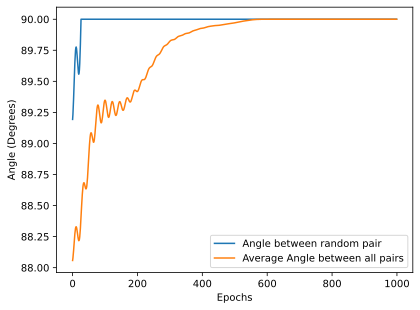

In [82]:
# Create an array of indices
epochs = np.arange(len(angle_list))

# Calculate line widths based on angle values
# line_widths = np.array(angle_list) / max(angle_list) * 5  # Adjust the scale factor (5) as needed

# Create the plot
plt.plot(epochs, angle_list, linestyle='-', label="Angle between random pair")
plt.plot(epochs, avg_angle_list, linestyle='-', label = "Average Angle between all pairs")

# for index, angle in zip(epochs, angle_list):
#     line_width = angle / max(angle_list) * 5  # Adjust the scale factor as needed
#     plt.plot([index], [angle], marker='.', markersize=2, linestyle='-', linewidth=line_width)

plt.xlabel('Epochs')
plt.ylabel('Angle (Degrees)')
plt.legend()